### **Transormasi Kurva (Citra Negatif)** 

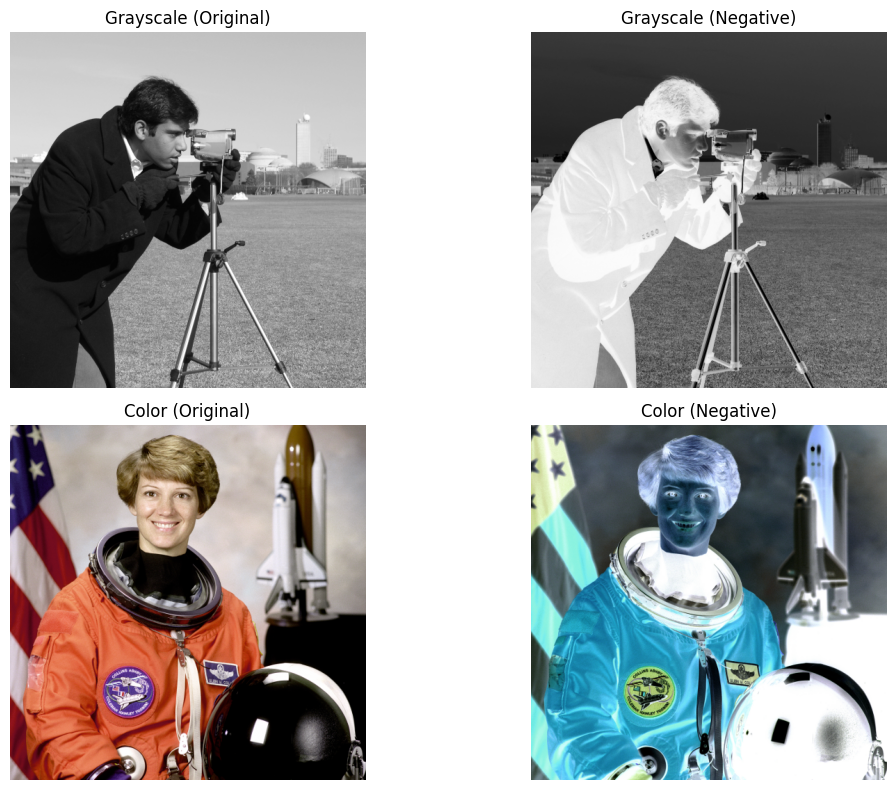

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float

# ===================
# 1. TRANSFORMASI NEGATIF CITRA GRAYSCALE
# ===================
image_gray_uint8 = data.camera()  # Citra grayscale (512x512, 0..255)
image_gray_float = img_as_float(image_gray_uint8)  # Konversi ke float [0..1]

negative_gray = 1.0 - image_gray_float  # Inversi intensitas: output = 1 - input

# ===================
# 2. TRANSFORMASI NEGATIF CITRA BERWARNA
# ===================
image_color_uint8 = data.astronaut()  # Citra berwarna (512x512x3, 0..255)
image_color_float = img_as_float(image_color_uint8)  # Konversi ke float [0..1]

negative_color = 1.0 - image_color_float  # Inversi intensitas tiap kanal RGB

# ===================
# 3. PLOTTING HASIL
# ===================
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Baris 1: Grayscale (original, negative)
axes[0, 0].imshow(image_gray_float, cmap='gray')
axes[0, 0].set_title("Grayscale (Original)")
axes[0, 0].axis('off')

axes[0, 1].imshow(negative_gray, cmap='gray')
axes[0, 1].set_title("Grayscale (Negative)")
axes[0, 1].axis('off')

# Baris 2: RGB (original, negative)
axes[1, 0].imshow(image_color_float)
axes[1, 0].set_title("Color (Original)")
axes[1, 0].axis('off')

axes[1, 1].imshow(negative_color)
axes[1, 1].set_title("Color (Negative)")
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


### **Histogram dan Ekualisasi Histogram** 

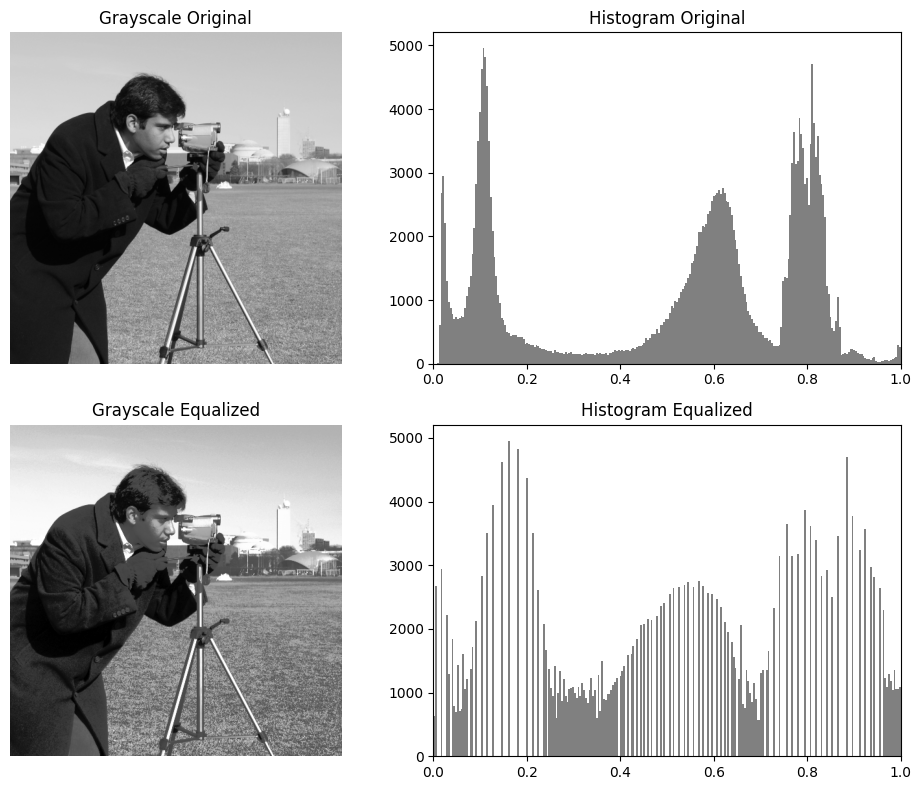

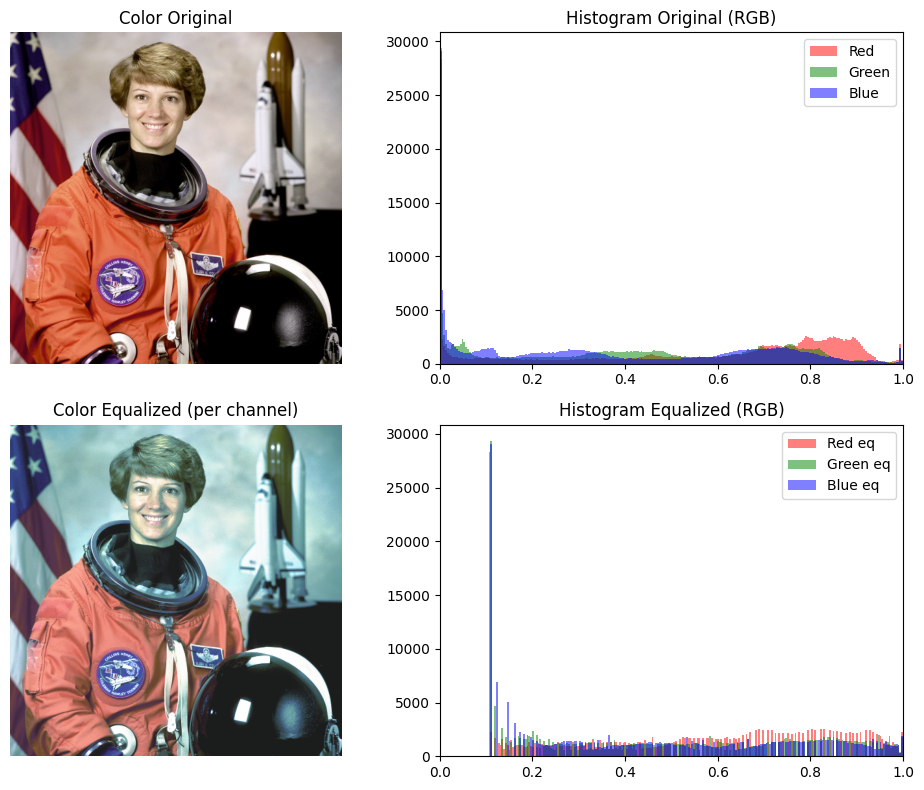

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, exposure, img_as_float

# -----------------------------------------------------
# BAGIAN 1: HISTOGRAM & EKUALISASI HISTOGRAM (GRAYSCALE)
# -----------------------------------------------------

# 1. Memuat citra grayscale
image_gray_uint8 = data.camera()  # sudah grayscale (uint8, 0..255)
image_gray = img_as_float(image_gray_uint8)  # konversi ke float [0..1]

# 2. Menghitung histogram citra asli
hist_gray, bins_gray = np.histogram(image_gray.ravel(), bins=256, range=(0, 1))

# 3. Ekualisasi histogram
image_gray_eq = exposure.equalize_hist(image_gray)
hist_gray_eq, bins_gray_eq = np.histogram(image_gray_eq.ravel(), bins=256, range=(0, 1))

# 4. Plot grayscale: citra asli & histogram, citra ekualisasi & histogram
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# (a) Citra Asli Grayscale
axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title("Grayscale Original")
axes[0, 0].axis('off')

# (b) Histogram Citra Asli
axes[0, 1].hist(image_gray.ravel(), bins=256, range=(0, 1), color='gray')
axes[0, 1].set_title("Histogram Original")
axes[0, 1].set_xlim(0, 1)

# (c) Citra Hasil Ekualisasi
axes[1, 0].imshow(image_gray_eq, cmap='gray')
axes[1, 0].set_title("Grayscale Equalized")
axes[1, 0].axis('off')

# (d) Histogram Citra Hasil Ekualisasi
axes[1, 1].hist(image_gray_eq.ravel(), bins=256, range=(0, 1), color='gray')
axes[1, 1].set_title("Histogram Equalized")
axes[1, 1].set_xlim(0, 1)

plt.tight_layout()
plt.show()

# -------------------------------------------------------
# BAGIAN 2: HISTOGRAM & EKUALISASI HISTOGRAM (CITRA WARNA)
# -------------------------------------------------------

# 1. Memuat citra berwarna
image_color_uint8 = data.astronaut()  # citra berwarna RGB (uint8)
image_color = img_as_float(image_color_uint8)  # konversi ke float [0..1]

# 2. Hitung histogram untuk tiap kanal, 256 bins
r_channel = image_color[:, :, 0]
g_channel = image_color[:, :, 1]
b_channel = image_color[:, :, 2]

hist_r, bins_r = np.histogram(r_channel.ravel(), bins=256, range=(0, 1))
hist_g, bins_g = np.histogram(g_channel.ravel(), bins=256, range=(0, 1))
hist_b, bins_b = np.histogram(b_channel.ravel(), bins=256, range=(0, 1))

# 3. Ekualisasi histogram tiap kanal secara independen
r_eq = exposure.equalize_hist(r_channel)
g_eq = exposure.equalize_hist(g_channel)
b_eq = exposure.equalize_hist(b_channel)

# Gabungkan kembali menjadi citra RGB yang sudah di-ekualisasi
image_color_eq = np.dstack((r_eq, g_eq, b_eq))

# 4. Plot citra berwarna & histogram
fig2, axes2 = plt.subplots(2, 2, figsize=(10, 8))

# (a) Citra Asli (Color)
axes2[0, 0].imshow(image_color)
axes2[0, 0].set_title("Color Original")
axes2[0, 0].axis('off')

# (b) Histogram Asli (tumpuk R, G, B)
axes2[0, 1].hist(r_channel.ravel(), bins=256, range=(0, 1), color='red', alpha=0.5, label='Red')
axes2[0, 1].hist(g_channel.ravel(), bins=256, range=(0, 1), color='green', alpha=0.5, label='Green')
axes2[0, 1].hist(b_channel.ravel(), bins=256, range=(0, 1), color='blue', alpha=0.5, label='Blue')
axes2[0, 1].set_title("Histogram Original (RGB)")
axes2[0, 1].set_xlim(0, 1)
axes2[0, 1].legend(loc='upper right')

# (c) Citra Hasil Ekualisasi (RGB)
axes2[1, 0].imshow(image_color_eq)
axes2[1, 0].set_title("Color Equalized (per channel)")
axes2[1, 0].axis('off')

# (d) Histogram Ekualisasi (tumpuk R, G, B)
axes2[1, 1].hist(r_eq.ravel(), bins=256, range=(0, 1), color='red', alpha=0.5, label='Red eq')
axes2[1, 1].hist(g_eq.ravel(), bins=256, range=(0, 1), color='green', alpha=0.5, label='Green eq')
axes2[1, 1].hist(b_eq.ravel(), bins=256, range=(0, 1), color='blue', alpha=0.5, label='Blue eq')
axes2[1, 1].set_title("Histogram Equalized (RGB)")
axes2[1, 1].set_xlim(0, 1)
axes2[1, 1].legend(loc='upper right')

plt.tight_layout()
plt.show()


### **Konvolusi (Filter Rata-rata)** 

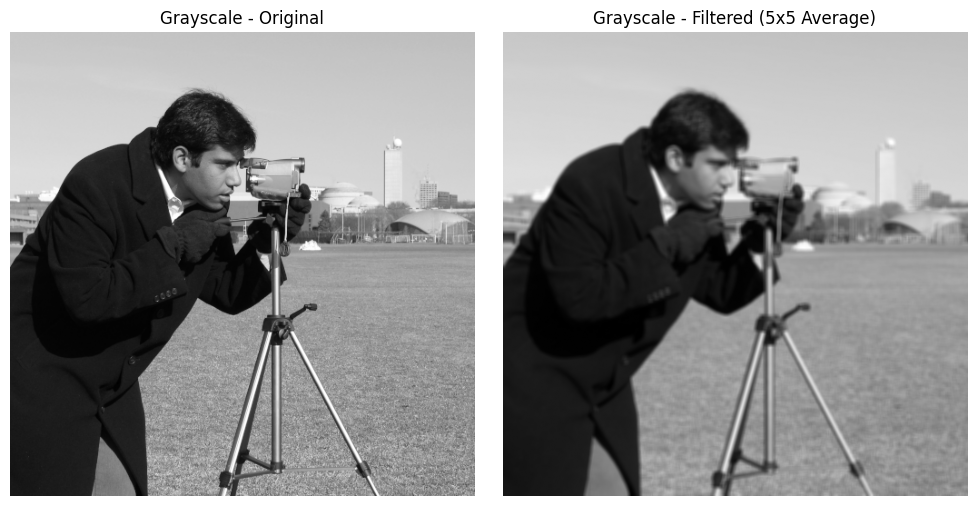

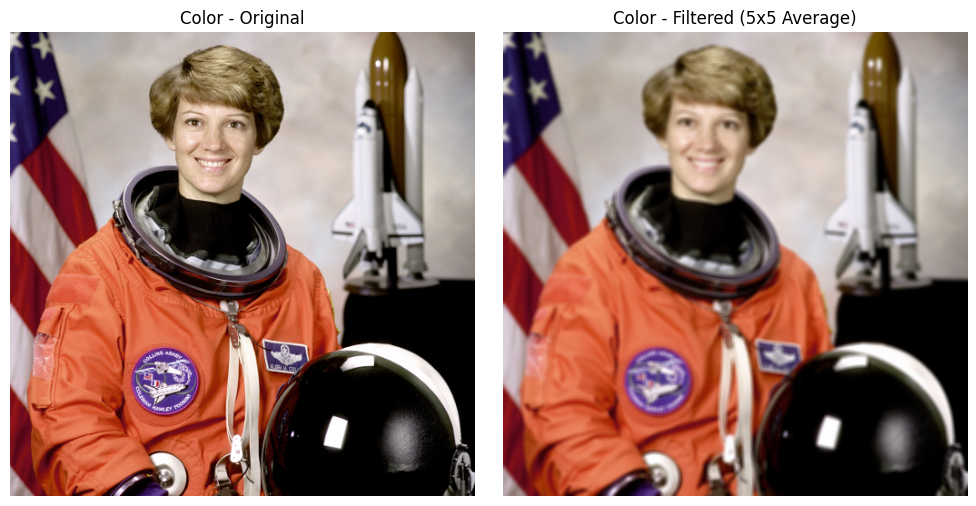

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy import ndimage as ndi

# --------------------------------------------------
# 1) FILTER RATA-RATA PADA CITRA GRAYSCALE
# --------------------------------------------------

# A. Memuat citra grayscale (camera)
gray_uint8 = data.camera()  # range 0..255
gray_img = img_as_float(gray_uint8)  # konversi menjadi float [0..1]

# B. Definisikan kernel filter rata-rata (contoh: 5x5)
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), dtype=float) / (kernel_size * kernel_size)

# C. Lakukan konvolusi pada citra grayscale
gray_filtered = ndi.convolve(gray_img, kernel, mode='reflect')

# D. Tampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(gray_img, cmap='gray')
axes[0].set_title("Grayscale - Original")
axes[0].axis('off')

axes[1].imshow(gray_filtered, cmap='gray')
axes[1].set_title(f"Grayscale - Filtered ({kernel_size}x{kernel_size} Average)")
axes[1].axis('off')

plt.tight_layout()
plt.show()

# --------------------------------------------------
# 2) FILTER RATA-RATA PADA CITRA BERWARNA
# --------------------------------------------------

# A. Memuat citra berwarna (astronaut)
color_uint8 = data.astronaut()  # citra RGB (uint8, 0..255)
color_img = img_as_float(color_uint8)  # konversi float [0..1]

# B. Terapkan filter rata-rata pada tiap kanal R, G, B secara terpisah, lalu gabungkan
color_filtered = np.zeros_like(color_img)

for c in range(3):  # c = 0 (Red), 1 (Green), 2 (Blue)
    channel_original = color_img[:, :, c]
    channel_filtered = ndi.convolve(channel_original, kernel, mode='reflect')
    color_filtered[:, :, c] = channel_filtered

# C. Tampilkan hasil
fig2, axes2 = plt.subplots(1, 2, figsize=(10, 5))
axes2[0].imshow(color_img)
axes2[0].set_title("Color - Original")
axes2[0].axis('off')

axes2[1].imshow(color_filtered)
axes2[1].set_title(f"Color - Filtered ({kernel_size}x{kernel_size} Average)")
axes2[1].axis('off')

plt.tight_layout()
plt.show()


### **Filter Median (penghilangan noise/derau)** 

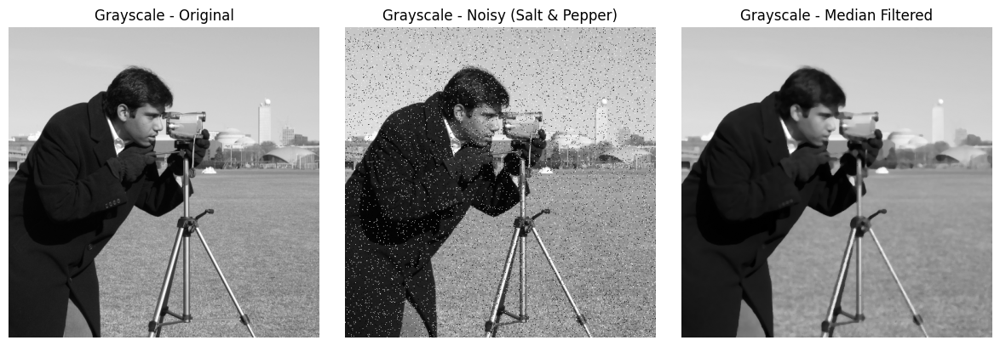

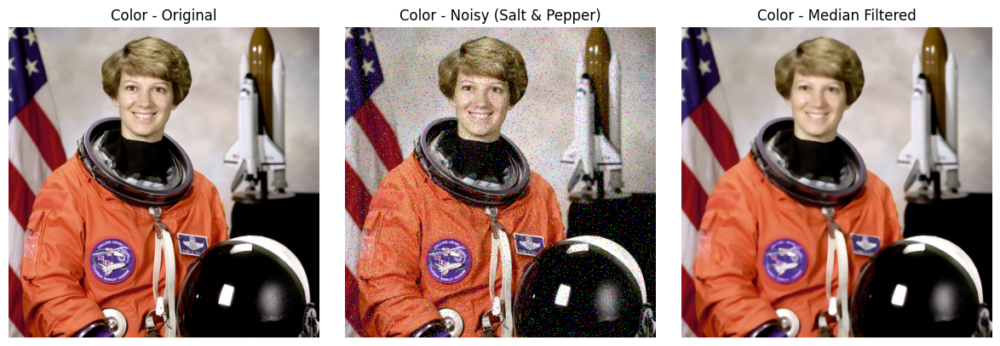

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, util, filters, morphology, img_as_float

# -----------------------------------------
# 1) FILTER MEDIAN PADA CITRA GRAYSCALE
# -----------------------------------------

# A. Memuat citra grayscale (contoh: 'camera')
gray_uint8 = data.camera()  # Grayscale, uint8
gray_float = img_as_float(gray_uint8)  # Konversi float [0..1]

# B. Menambahkan noise jenis salt-and-pepper
gray_noisy = util.random_noise(gray_float, mode='s&p', amount=0.05)  # 5% noise

# C. Menerapkan filter median
# Menggunakan structuring element berbentuk disk dengan radius 3
disk3 = morphology.disk(3)
gray_denoised = filters.median(gray_noisy, disk3)

# D. Plot hasil
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(gray_float, cmap='gray')
axes[0].set_title("Grayscale - Original")
axes[0].axis('off')

axes[1].imshow(gray_noisy, cmap='gray')
axes[1].set_title("Grayscale - Noisy (Salt & Pepper)")
axes[1].axis('off')

axes[2].imshow(gray_denoised, cmap='gray')
axes[2].set_title("Grayscale - Median Filtered")
axes[2].axis('off')

plt.tight_layout()
plt.show()

# -----------------------------------------
# 2) FILTER MEDIAN PADA CITRA BERWARNA
# -----------------------------------------

# A. Memuat citra berwarna (contoh: 'astronaut')
color_uint8 = data.astronaut()  # RGB, uint8
color_float = img_as_float(color_uint8)  # Rentang [0..1]

# B. Menambahkan noise salt-and-pepper
color_noisy = util.random_noise(color_float, mode='s&p', amount=0.05)

# C. Menerapkan filter median
# Menggunakan filter median per kanal (R, G, B)
color_denoised = np.zeros_like(color_noisy)
for c in range(color_noisy.shape[2]):  # Loop kanal (Red, Green, Blue)
    color_denoised[:, :, c] = filters.median(color_noisy[:, :, c], morphology.disk(3))

# D. Plot hasil
fig2, axes2 = plt.subplots(1, 3, figsize=(12, 4))
axes2[0].imshow(color_float)
axes2[0].set_title("Color - Original")
axes2[0].axis('off')

axes2[1].imshow(color_noisy)
axes2[1].set_title("Color - Noisy (Salt & Pepper)")
axes2[1].axis('off')

axes2[2].imshow(color_denoised)
axes2[2].set_title("Color - Median Filtered")
axes2[2].axis('off')

plt.tight_layout()
plt.show()


### **Eksperimen Transformasi Intensitas Lain**

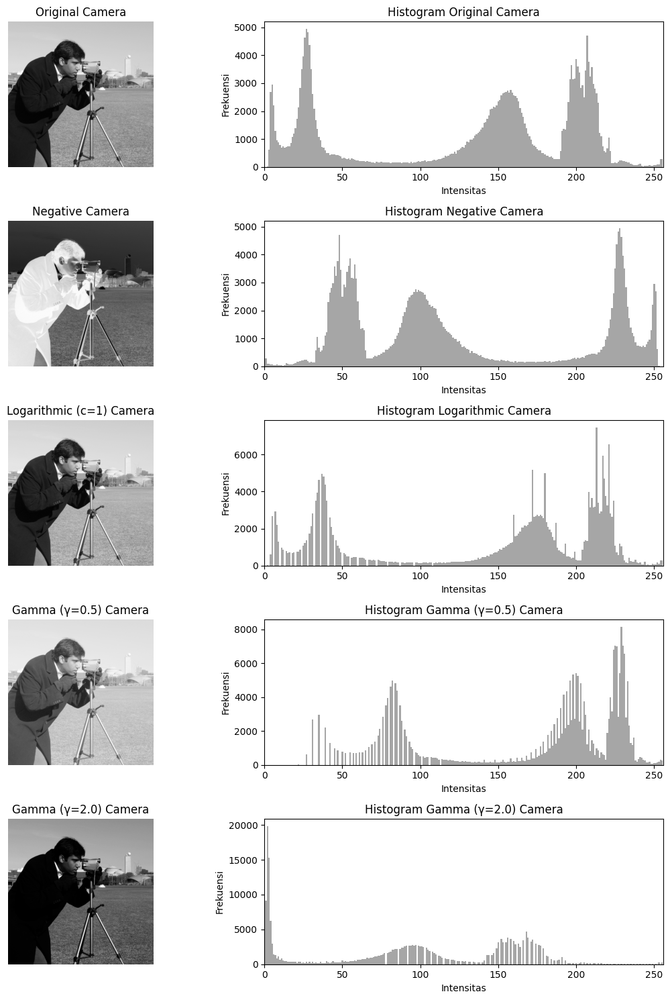

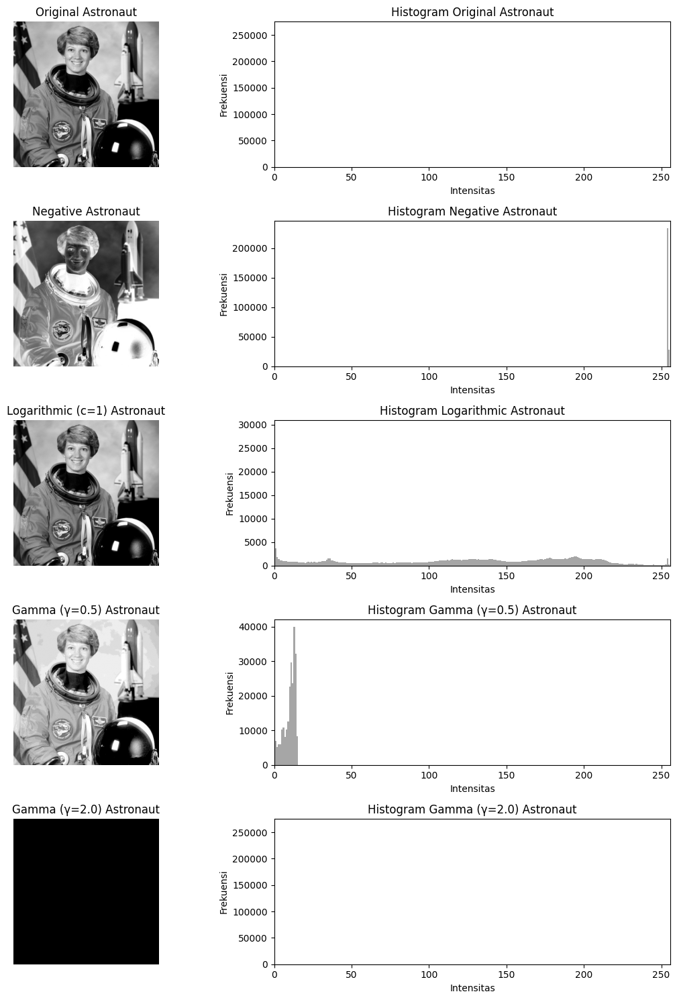

Analisis Transformasi Intensitas:

1. Transformasi Negatif:
   - Menghasilkan tampilan 'negatif film' dengan inversi intensitas
   - Histogram terbalik dari citra asli

2. Transformasi Logaritmik:
   - Meningkatkan kontras pada area gelap (bayangan)
   - Menekan kontras pada area terang (highlight)
   - Berguna untuk gambar dengan rentang dinamis yang besar
   - Histogram cenderung mengalami kompresi ke arah nilai intensitas yang lebih tinggi

3. Transformasi Gamma (γ=0.5):
   - Meningkatkan kecerahan keseluruhan citra
   - Detail pada area gelap menjadi lebih terlihat
   - Histogram bergeser ke kanan (area yang lebih terang)

4. Transformasi Gamma (γ=2.0):
   - Mengurangi kecerahan keseluruhan citra
   - Meningkatkan kontras pada area terang
   - Histogram bergeser ke kiri (area yang lebih gelap)

Perbedaan Antara Camera dan Astronaut:
   - Camera memiliki distribusi intensitas yang lebih merata
   - Astronaut memiliki lebih banyak area gelap dan kontras yang lebih tinggi
   - Transfo

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color
from skimage import exposure
import math

# Menyiapkan citra grayscale
camera = data.camera()  # Sudah dalam bentuk grayscale
astronaut = color.rgb2gray(data.astronaut())  # Mengubah ke grayscale

# Fungsi transformasi negatif
def negative_transform(image):
    return 255 - image

# Fungsi transformasi logaritmik
def log_transform(image, c=1):
    # Normalisasi gambar ke range [0, 1]
    normalized = image / 255.0
    # Aplikasikan transformasi logaritmik
    result = c * np.log1p(normalized)  # log1p = log(1+x) untuk menghindari log(0)
    # Normalisasi kembali ke range [0, 255]
    return (result * 255 / result.max()).astype(np.uint8)

# Fungsi transformasi gamma
def gamma_transform(image, gamma=1.0):
    # Normalisasi gambar ke range [0, 1]
    normalized = image / 255.0
    # Aplikasikan transformasi gamma
    result = np.power(normalized, gamma)
    # Normalisasi kembali ke range [0, 255]
    return (result * 255).astype(np.uint8)

# Membuat transformasi untuk kedua gambar
camera_neg = negative_transform(camera)
camera_log = log_transform(camera, c=1)
camera_gamma1 = gamma_transform(camera, gamma=0.5)  # Gamma < 1 meningkatkan kecerahan
camera_gamma2 = gamma_transform(camera, gamma=2.0)  # Gamma > 1 mengurangi kecerahan

astronaut_neg = negative_transform(astronaut)
astronaut_log = log_transform(astronaut, c=1)
astronaut_gamma1 = gamma_transform(astronaut, gamma=0.5)
astronaut_gamma2 = gamma_transform(astronaut, gamma=2.0)

# Fungsi untuk menampilkan histogram
def plot_histogram(image, ax, title):
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    ax.bar(range(256), hist, width=1, color='gray', alpha=0.7)
    ax.set_xlim([0, 256])
    ax.set_title(title)
    ax.set_xlabel('Intensitas')
    ax.set_ylabel('Frekuensi')

# Fungsi untuk menampilkan gambar dan histogramnya
def display_images_and_histograms(original, neg, log, gamma1, gamma2, title):
    fig, axs = plt.subplots(5, 2, figsize=(12, 15))
    
    # Gambar asli
    axs[0, 0].imshow(original, cmap='gray')
    axs[0, 0].set_title(f'Original {title}')
    axs[0, 0].axis('off')
    plot_histogram(original, axs[0, 1], f'Histogram Original {title}')
    
    # Transformasi negatif
    axs[1, 0].imshow(neg, cmap='gray')
    axs[1, 0].set_title(f'Negative {title}')
    axs[1, 0].axis('off')
    plot_histogram(neg, axs[1, 1], f'Histogram Negative {title}')
    
    # Transformasi logaritmik
    axs[2, 0].imshow(log, cmap='gray')
    axs[2, 0].set_title(f'Logarithmic (c=1) {title}')
    axs[2, 0].axis('off')
    plot_histogram(log, axs[2, 1], f'Histogram Logarithmic {title}')
    
    # Transformasi gamma (γ < 1)
    axs[3, 0].imshow(gamma1, cmap='gray')
    axs[3, 0].set_title(f'Gamma (γ=0.5) {title}')
    axs[3, 0].axis('off')
    plot_histogram(gamma1, axs[3, 1], f'Histogram Gamma (γ=0.5) {title}')
    
    # Transformasi gamma (γ > 1)
    axs[4, 0].imshow(gamma2, cmap='gray')
    axs[4, 0].set_title(f'Gamma (γ=2.0) {title}')
    axs[4, 0].axis('off')
    plot_histogram(gamma2, axs[4, 1], f'Histogram Gamma (γ=2.0) {title}')
    
    plt.tight_layout()
    return fig

# Tampilkan hasil transformasi untuk camera
fig1 = display_images_and_histograms(
    camera, camera_neg, camera_log, camera_gamma1, camera_gamma2, 'Camera'
)
plt.show()

# Tampilkan hasil transformasi untuk astronaut
fig2 = display_images_and_histograms(
    astronaut, astronaut_neg, astronaut_log, astronaut_gamma1, astronaut_gamma2, 'Astronaut'
)
plt.show()

# Analisis hasil transformasi
print("Analisis Transformasi Intensitas:")
print("\n1. Transformasi Negatif:")
print("   - Menghasilkan tampilan 'negatif film' dengan inversi intensitas")
print("   - Histogram terbalik dari citra asli")

print("\n2. Transformasi Logaritmik:")
print("   - Meningkatkan kontras pada area gelap (bayangan)")
print("   - Menekan kontras pada area terang (highlight)")
print("   - Berguna untuk gambar dengan rentang dinamis yang besar")
print("   - Histogram cenderung mengalami kompresi ke arah nilai intensitas yang lebih tinggi")

print("\n3. Transformasi Gamma (γ=0.5):")
print("   - Meningkatkan kecerahan keseluruhan citra")
print("   - Detail pada area gelap menjadi lebih terlihat")
print("   - Histogram bergeser ke kanan (area yang lebih terang)")

print("\n4. Transformasi Gamma (γ=2.0):")
print("   - Mengurangi kecerahan keseluruhan citra")
print("   - Meningkatkan kontras pada area terang")
print("   - Histogram bergeser ke kiri (area yang lebih gelap)")

print("\nPerbedaan Antara Camera dan Astronaut:")
print("   - Camera memiliki distribusi intensitas yang lebih merata")
print("   - Astronaut memiliki lebih banyak area gelap dan kontras yang lebih tinggi")
print("   - Transformasi logaritmik lebih efektif pada citra dengan kontras tinggi seperti astronaut")
print("   - Gamma koreksi memberikan hasil yang berbeda berdasarkan distribusi intensitas awal")

### **Perbandingan Metode Peningkatan Kontras**

=== PERBANDINGAN METODE PENINGKATAN KONTRAS ===

1. CITRA DENGAN KONTRAS RENDAH


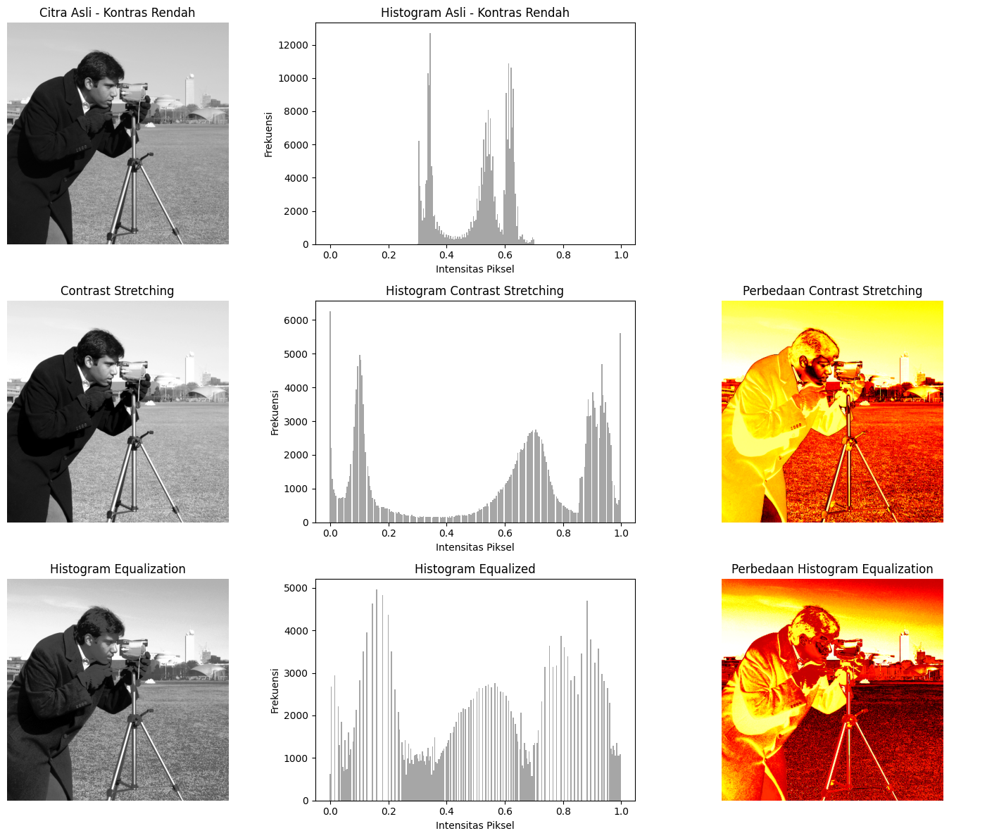


--- Analisis Citra Kontras Rendah ---
Standar deviasi citra asli: 0.1155
Standar deviasi setelah contrast stretching: 0.3392
Peningkatan kontras (contrast stretching): 193.64%
Standar deviasi setelah histogram equalization: 0.2915
Peningkatan kontras (histogram equalization): 152.34%

Perbedaan Karakteristik:
1. Contrast Stretching:
   - Mempertahankan distribusi intensitas relatif
   - Memperlebar rentang intensitas dengan memetakan ulang nilai berdasarkan persentil
   - Hasil lebih natural dan mempertahankan hubungan tonal relatif

2. Histogram Equalization:
   - Mendistribusikan ulang intensitas untuk mencapai distribusi yang lebih seragam
   - Dapat menghasilkan kontras yang lebih tinggi tetapi kadang tampak tidak natural
   - Efektif untuk citra dengan distribusi histogram yang sempit
   - Dapat menghasilkan noise pada area yang seragam

Kesimpulan: Contrast Stretching lebih efektif meningkatkan kontras untuk citra ini
(peningkatan 193.64% vs 152.34%)


2. CITRA TERLALU GELAP


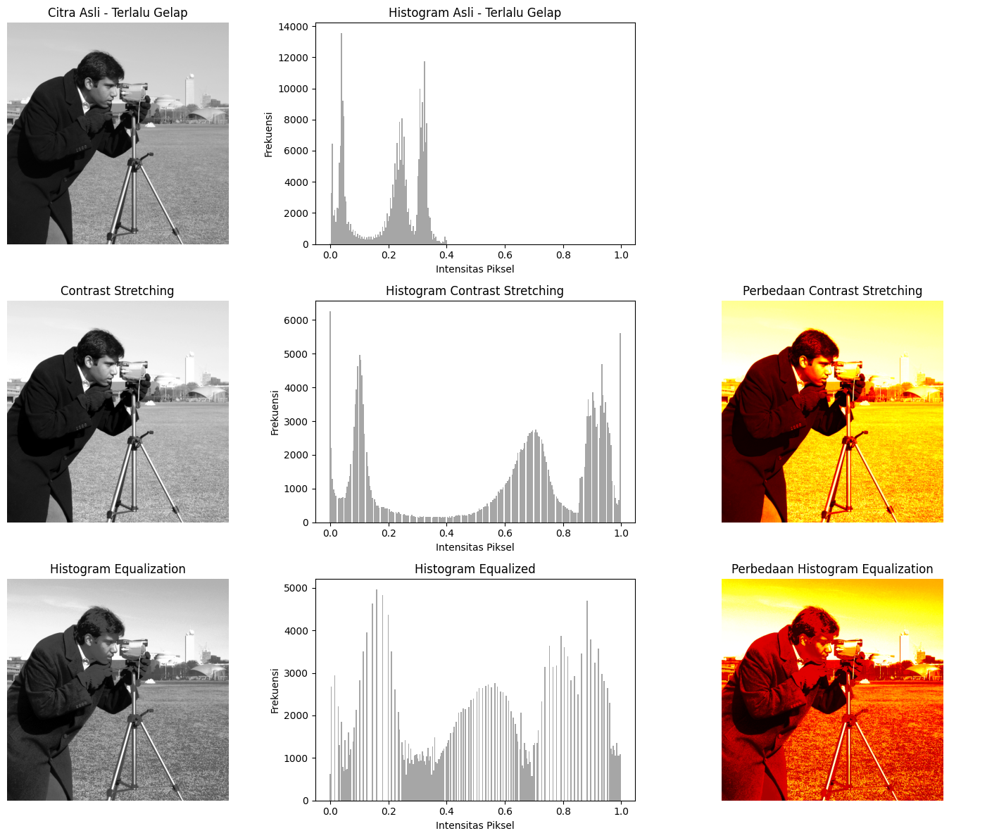


--- Analisis Citra Terlalu Gelap ---
Standar deviasi citra asli: 0.1155
Standar deviasi setelah contrast stretching: 0.3392
Peningkatan kontras (contrast stretching): 193.64%
Standar deviasi setelah histogram equalization: 0.2915
Peningkatan kontras (histogram equalization): 152.34%

Perbedaan Karakteristik:
1. Contrast Stretching:
   - Mempertahankan distribusi intensitas relatif
   - Memperlebar rentang intensitas dengan memetakan ulang nilai berdasarkan persentil
   - Hasil lebih natural dan mempertahankan hubungan tonal relatif

2. Histogram Equalization:
   - Mendistribusikan ulang intensitas untuk mencapai distribusi yang lebih seragam
   - Dapat menghasilkan kontras yang lebih tinggi tetapi kadang tampak tidak natural
   - Efektif untuk citra dengan distribusi histogram yang sempit
   - Dapat menghasilkan noise pada area yang seragam

Kesimpulan: Contrast Stretching lebih efektif meningkatkan kontras untuk citra ini
(peningkatan 193.64% vs 152.34%)


3. CITRA TERLALU TERANG


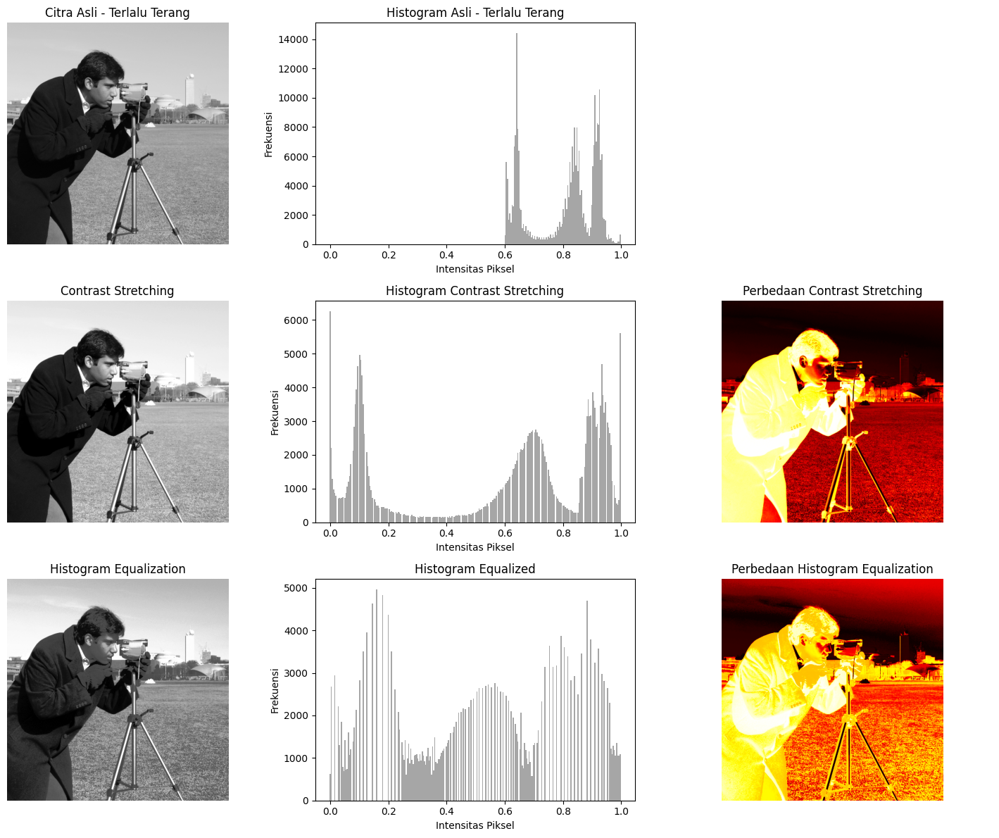


--- Analisis Citra Terlalu Terang ---
Standar deviasi citra asli: 0.1155
Standar deviasi setelah contrast stretching: 0.3392
Peningkatan kontras (contrast stretching): 193.64%
Standar deviasi setelah histogram equalization: 0.2915
Peningkatan kontras (histogram equalization): 152.34%

Perbedaan Karakteristik:
1. Contrast Stretching:
   - Mempertahankan distribusi intensitas relatif
   - Memperlebar rentang intensitas dengan memetakan ulang nilai berdasarkan persentil
   - Hasil lebih natural dan mempertahankan hubungan tonal relatif

2. Histogram Equalization:
   - Mendistribusikan ulang intensitas untuk mencapai distribusi yang lebih seragam
   - Dapat menghasilkan kontras yang lebih tinggi tetapi kadang tampak tidak natural
   - Efektif untuk citra dengan distribusi histogram yang sempit
   - Dapat menghasilkan noise pada area yang seragam

Kesimpulan: Contrast Stretching lebih efektif meningkatkan kontras untuk citra ini
(peningkatan 193.64% vs 152.34%)


4. CITRA ASTRONAUT DENGAN 

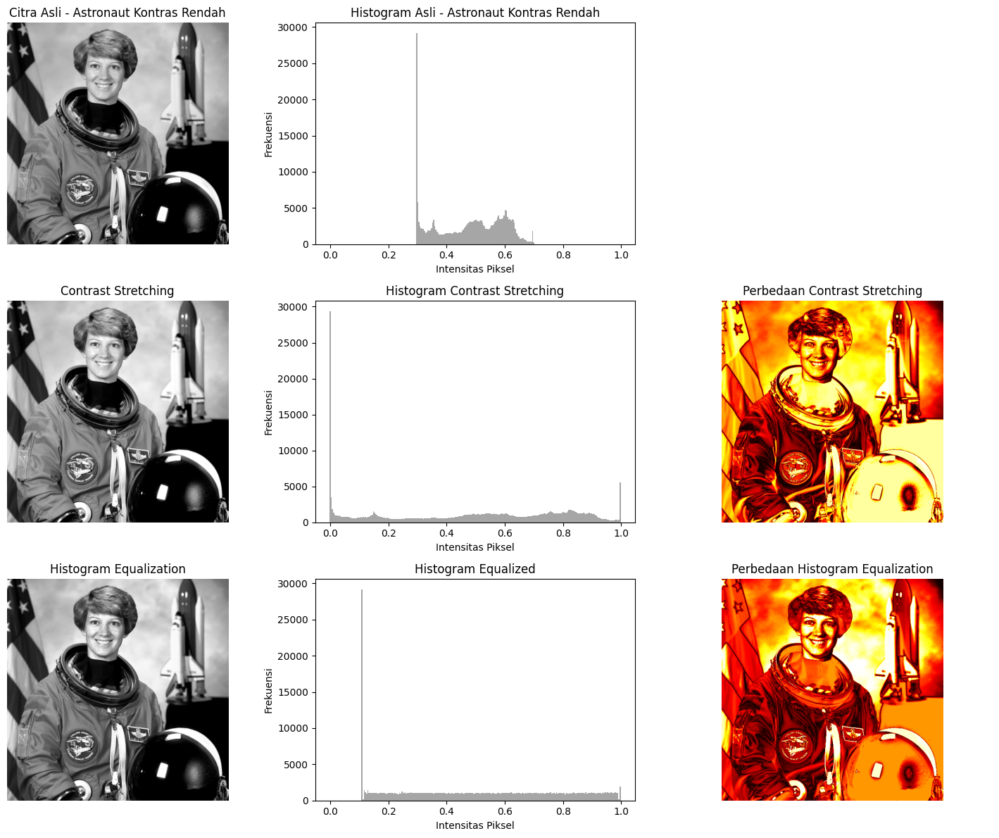


--- Analisis Citra Astronaut Kontras Rendah ---
Standar deviasi citra asli: 0.1182
Standar deviasi setelah contrast stretching: 0.3198
Peningkatan kontras (contrast stretching): 170.48%
Standar deviasi setelah histogram equalization: 0.2797
Peningkatan kontras (histogram equalization): 136.55%

Perbedaan Karakteristik:
1. Contrast Stretching:
   - Mempertahankan distribusi intensitas relatif
   - Memperlebar rentang intensitas dengan memetakan ulang nilai berdasarkan persentil
   - Hasil lebih natural dan mempertahankan hubungan tonal relatif

2. Histogram Equalization:
   - Mendistribusikan ulang intensitas untuk mencapai distribusi yang lebih seragam
   - Dapat menghasilkan kontras yang lebih tinggi tetapi kadang tampak tidak natural
   - Efektif untuk citra dengan distribusi histogram yang sempit
   - Dapat menghasilkan noise pada area yang seragam

Kesimpulan: Contrast Stretching lebih efektif meningkatkan kontras untuk citra ini
(peningkatan 170.48% vs 136.55%)


Kesimpulan Umum:

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, exposure
from skimage import io
from skimage.util import random_noise

# Fungsi untuk membuat citra dengan kontras rendah
def create_low_contrast_image(image):
    # Memetakan intensitas citra ke rentang [0.3, 0.7]
    # untuk simulasi citra dengan kontras rendah
    low_contrast = exposure.rescale_intensity(image, out_range=(0.3, 0.7))
    return low_contrast

# Fungsi untuk membuat citra yang terlalu gelap
def create_dark_image(image):
    # Memetakan intensitas citra ke rentang [0, 0.4]
    dark_image = exposure.rescale_intensity(image, out_range=(0, 0.4))
    return dark_image

# Fungsi untuk membuat citra yang terlalu terang
def create_bright_image(image):
    # Memetakan intensitas citra ke rentang [0.6, 1.0]
    bright_image = exposure.rescale_intensity(image, out_range=(0.6, 1.0))
    return bright_image

# Fungsi untuk menampilkan histogram
def plot_histogram(image, ax, title):
    hist, bins = np.histogram(image.flatten(), 256, [0, 1])
    ax.bar(bins[:-1], hist, width=bins[1]-bins[0], color='gray', alpha=0.7)
    ax.set_title(title)
    ax.set_xlabel('Intensitas Piksel')
    ax.set_ylabel('Frekuensi')

# Fungsi untuk membandingkan metode peningkatan kontras
def compare_contrast_enhancement(image, title):
    # Menyiapkan subplot
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))
    
    # 1. Citra asli dan histogramnya
    axes[0, 0].imshow(image, cmap='gray')
    axes[0, 0].set_title(f'Citra Asli - {title}')
    axes[0, 0].axis('off')
    plot_histogram(image, axes[0, 1], f'Histogram Asli - {title}')
    axes[0, 2].axis('off')  # Kolom ketiga baris pertama kosong
    
    # 2. Contrast Stretching (Peregangan Kontras)
    p2, p98 = np.percentile(image, (2, 98))
    stretched = exposure.rescale_intensity(image, in_range=(p2, p98), out_range=(0, 1))
    
    axes[1, 0].imshow(stretched, cmap='gray')
    axes[1, 0].set_title('Contrast Stretching')
    axes[1, 0].axis('off')
    plot_histogram(stretched, axes[1, 1], 'Histogram Contrast Stretching')
    
    # Menampilkan perbedaan dengan citra asli
    diff_stretched = np.abs(stretched - image)
    axes[1, 2].imshow(diff_stretched, cmap='hot')
    axes[1, 2].set_title('Perbedaan Contrast Stretching')
    axes[1, 2].axis('off')
    
    # 3. Histogram Equalization (Ekualisasi Histogram)
    equalized = exposure.equalize_hist(image)
    
    axes[2, 0].imshow(equalized, cmap='gray')
    axes[2, 0].set_title('Histogram Equalization')
    axes[2, 0].axis('off')
    plot_histogram(equalized, axes[2, 1], 'Histogram Equalized')
    
    # Menampilkan perbedaan dengan citra asli
    diff_equalized = np.abs(equalized - image)
    axes[2, 2].imshow(diff_equalized, cmap='hot')
    axes[2, 2].set_title('Perbedaan Histogram Equalization')
    axes[2, 2].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Menghitung metrik peningkatan kontras
    original_std = np.std(image)
    stretched_std = np.std(stretched)
    equalized_std = np.std(equalized)
    
    print(f"\n--- Analisis Citra {title} ---")
    print(f"Standar deviasi citra asli: {original_std:.4f}")
    print(f"Standar deviasi setelah contrast stretching: {stretched_std:.4f}")
    print(f"Peningkatan kontras (contrast stretching): {(stretched_std/original_std - 1)*100:.2f}%")
    print(f"Standar deviasi setelah histogram equalization: {equalized_std:.4f}")
    print(f"Peningkatan kontras (histogram equalization): {(equalized_std/original_std - 1)*100:.2f}%")
    
    print("\nPerbedaan Karakteristik:")
    print("1. Contrast Stretching:")
    print("   - Mempertahankan distribusi intensitas relatif")
    print("   - Memperlebar rentang intensitas dengan memetakan ulang nilai berdasarkan persentil")
    print("   - Hasil lebih natural dan mempertahankan hubungan tonal relatif")
    
    print("\n2. Histogram Equalization:")
    print("   - Mendistribusikan ulang intensitas untuk mencapai distribusi yang lebih seragam")
    print("   - Dapat menghasilkan kontras yang lebih tinggi tetapi kadang tampak tidak natural")
    print("   - Efektif untuk citra dengan distribusi histogram yang sempit")
    print("   - Dapat menghasilkan noise pada area yang seragam")
    
    # Menentukan metode yang lebih efektif
    if (equalized_std/original_std) > (stretched_std/original_std):
        print("\nKesimpulan: Histogram Equalization lebih efektif meningkatkan kontras untuk citra ini")
        print(f"(peningkatan {(equalized_std/original_std - 1)*100:.2f}% vs {(stretched_std/original_std - 1)*100:.2f}%)")
    else:
        print("\nKesimpulan: Contrast Stretching lebih efektif meningkatkan kontras untuk citra ini")
        print(f"(peningkatan {(stretched_std/original_std - 1)*100:.2f}% vs {(equalized_std/original_std - 1)*100:.2f}%)")

# Load citra untuk pengujian
camera = data.camera() / 255.0  # Normalisasi ke [0,1]
astronaut = color.rgb2gray(data.astronaut())  # Konversi ke grayscale

# Buat beberapa variasi citra dengan kontras rendah
low_contrast_camera = create_low_contrast_image(camera)
dark_camera = create_dark_image(camera)
bright_camera = create_bright_image(camera)

# Bandingkan metode peningkatan kontras pada setiap citra
print("=== PERBANDINGAN METODE PENINGKATAN KONTRAS ===")
print("\n1. CITRA DENGAN KONTRAS RENDAH")
compare_contrast_enhancement(low_contrast_camera, "Kontras Rendah")

print("\n\n2. CITRA TERLALU GELAP")
compare_contrast_enhancement(dark_camera, "Terlalu Gelap")

print("\n\n3. CITRA TERLALU TERANG")
compare_contrast_enhancement(bright_camera, "Terlalu Terang")

# Bandingkan juga pada citra astronaut dengan kontras rendah
low_contrast_astronaut = create_low_contrast_image(astronaut)
print("\n\n4. CITRA ASTRONAUT DENGAN KONTRAS RENDAH")
compare_contrast_enhancement(low_contrast_astronaut, "Astronaut Kontras Rendah")

print("\n\nKesimpulan Umum:")
print("1. Contrast Stretching:")
print("   - Lebih baik untuk meningkatkan kontras secara natural dan mempertahankan hubungan tonal")
print("   - Cocok untuk citra dengan distribusi yang lebih merata tetapi terbatas dalam rentang dinamis")
print("   - Mempertahankan detail halus dan tidak menciptakan artefak")

print("\n2. Histogram Equalization:")
print("   - Lebih agresif dalam meningkatkan kontras")
print("   - Sangat efektif untuk citra dengan distribusi histogram yang sempit atau terkonsentrasi")
print("   - Dapat menciptakan hasil yang tidak natural dan kadang menambah noise")
print("   - Umumnya lebih efektif untuk citra yang sangat gelap atau sangat terang")

### **Filter Median vs Filter Rata-rata**

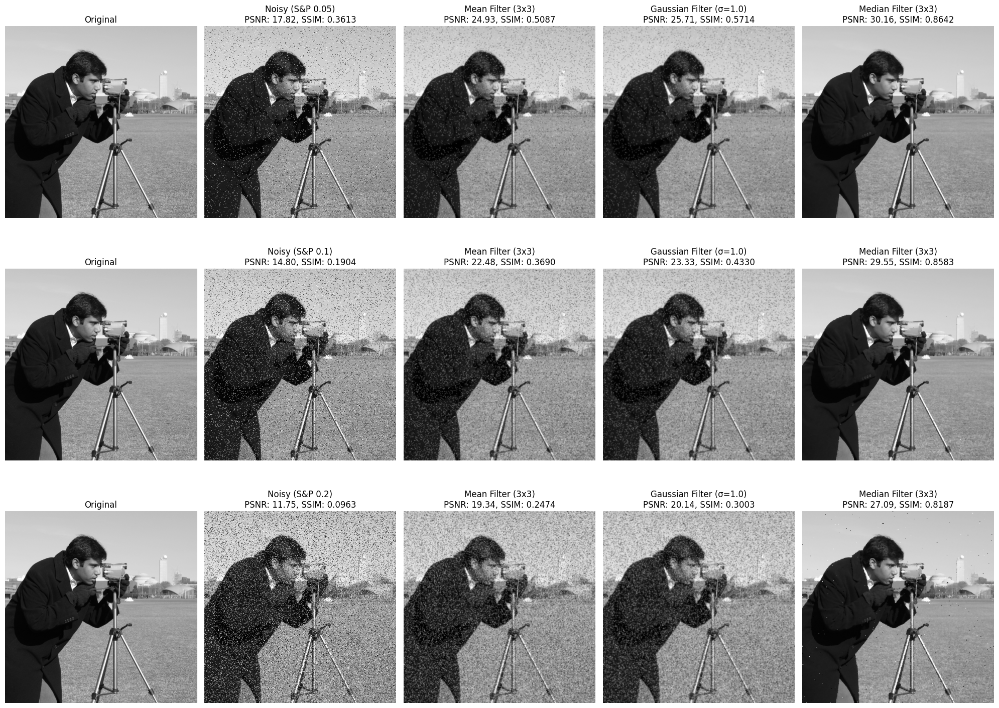

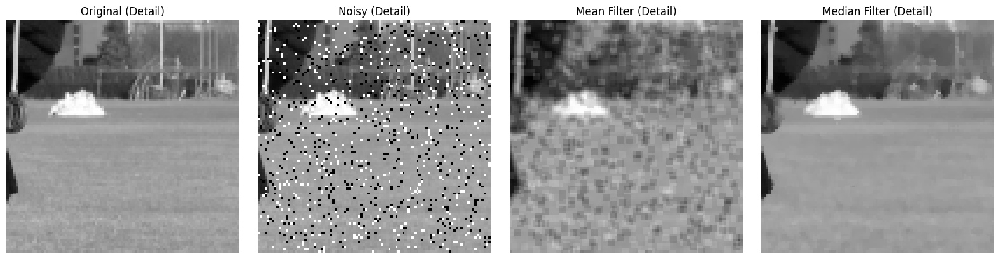

=== ANALISIS PERBANDINGAN FILTER ===

Metrik PSNR (Peak Signal-to-Noise Ratio):
- Nilai lebih tinggi = kualitas lebih baik

Noise Level: 0.05
  Noisy Image: 17.82 dB
  Mean Filter: 24.93 dB
  Gaussian Filter: 25.71 dB
  Median Filter: 30.16 dB

Noise Level: 0.1
  Noisy Image: 14.80 dB
  Mean Filter: 22.48 dB
  Gaussian Filter: 23.33 dB
  Median Filter: 29.55 dB

Noise Level: 0.2
  Noisy Image: 11.75 dB
  Mean Filter: 19.34 dB
  Gaussian Filter: 20.14 dB
  Median Filter: 27.09 dB

Metrik SSIM (Structural Similarity Index):
- Nilai lebih tinggi = kualitas lebih baik (max 1.0)

Noise Level: 0.05
  Noisy Image: 0.3613
  Mean Filter: 0.5087
  Gaussian Filter: 0.5714
  Median Filter: 0.8642

Noise Level: 0.1
  Noisy Image: 0.1904
  Mean Filter: 0.3690
  Gaussian Filter: 0.4330
  Median Filter: 0.8583

Noise Level: 0.2
  Noisy Image: 0.0963
  Mean Filter: 0.2474
  Gaussian Filter: 0.3003
  Median Filter: 0.8187

=== ANALISIS KUALITATIF ===

1. Filter Rata-rata (Mean Filter):
   - Mengurangi n

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, util
from skimage.filters import median, gaussian
from scipy import ndimage
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Siapkan citra awal
original = data.camera() / 255.0  # Normalized to [0, 1]

# Tambahkan salt-and-pepper noise dengan berbagai level
noise_levels = [0.05, 0.1, 0.2]
noisy_images = []

for noise_level in noise_levels:
    # Salt-and-pepper noise
    noisy = util.random_noise(original, mode='s&p', amount=noise_level, salt_vs_pepper=0.5)
    noisy_images.append((noise_level, noisy))

# Fungsi untuk menerapkan filter mean (rata-rata)
def apply_mean_filter(image, kernel_size):
    # Buat kernel rata-rata
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
    # Terapkan konvolusi
    return ndimage.convolve(image, kernel)

# Fungsi untuk menerapkan filter gaussian
def apply_gaussian_filter(image, sigma):
    return gaussian(image, sigma=sigma)

# Fungsi untuk menerapkan filter median
def apply_median_filter(image, kernel_size):
    return median(image, np.ones((kernel_size, kernel_size)))

# Fungsi untuk menampilkan hasil filter dan menyediakan evaluasi metrik
def compare_filters(original, noisy_images):
    fig_rows = len(noisy_images)
    fig, axes = plt.subplots(fig_rows, 5, figsize=(20, 5 * fig_rows))
    
    # Kalau hanya satu tingkat noise, konversi axes ke array 2D
    if fig_rows == 1:
        axes = axes.reshape(1, -1)
    
    # Kernel sizes untuk filter
    kernel_size = 3
    sigma = 1.0
    
    # Data untuk evaluasi metrik
    metrics_data = []
    
    for i, (noise_level, noisy) in enumerate(noisy_images):
        # Terapkan filter
        mean_filtered = apply_mean_filter(noisy, kernel_size)
        gaussian_filtered = apply_gaussian_filter(noisy, sigma)
        median_filtered = apply_median_filter(noisy, kernel_size)
        
        # Hitung metrik kualitas - Fix: tambahkan parameter data_range=1.0 untuk data float [0,1]
        psnr_noisy = psnr(original, noisy, data_range=1.0)
        psnr_mean = psnr(original, mean_filtered, data_range=1.0)
        psnr_gaussian = psnr(original, gaussian_filtered, data_range=1.0)
        psnr_median = psnr(original, median_filtered, data_range=1.0)
        
        # Fix: tambahkan parameter data_range=1.0 untuk ssim juga
        ssim_noisy = ssim(original, noisy, data_range=1.0)
        ssim_mean = ssim(original, mean_filtered, data_range=1.0)
        ssim_gaussian = ssim(original, gaussian_filtered, data_range=1.0)
        ssim_median = ssim(original, median_filtered, data_range=1.0)
        
        # Tampilkan gambar dan metrik
        axes[i, 0].imshow(original, cmap='gray')
        axes[i, 0].set_title('Original')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(noisy, cmap='gray')
        axes[i, 1].set_title(f'Noisy (S&P {noise_level})\nPSNR: {psnr_noisy:.2f}, SSIM: {ssim_noisy:.4f}')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(mean_filtered, cmap='gray')
        axes[i, 2].set_title(f'Mean Filter ({kernel_size}x{kernel_size})\nPSNR: {psnr_mean:.2f}, SSIM: {ssim_mean:.4f}')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(gaussian_filtered, cmap='gray')
        axes[i, 3].set_title(f'Gaussian Filter (σ={sigma})\nPSNR: {psnr_gaussian:.2f}, SSIM: {ssim_gaussian:.4f}')
        axes[i, 3].axis('off')
        
        axes[i, 4].imshow(median_filtered, cmap='gray')
        axes[i, 4].set_title(f'Median Filter ({kernel_size}x{kernel_size})\nPSNR: {psnr_median:.2f}, SSIM: {ssim_median:.4f}')
        axes[i, 4].axis('off')
        
        # Kumpulkan data metrik
        metrics_data.append({
            'noise_level': noise_level,
            'psnr_noisy': psnr_noisy,
            'psnr_mean': psnr_mean,
            'psnr_gaussian': psnr_gaussian,
            'psnr_median': psnr_median,
            'ssim_noisy': ssim_noisy,
            'ssim_mean': ssim_mean,
            'ssim_gaussian': ssim_gaussian,
            'ssim_median': ssim_median
        })
    
    plt.tight_layout()
    plt.show()
    
    # Tampilkan perbandingan detail tepi
    # Gunakan indeks yang sesuai (1 jika ada 3 noise level)
    middle_index = min(1, len(noisy_images) - 1)
    mean_result = apply_mean_filter(noisy_images[middle_index][1], kernel_size)
    median_result = apply_median_filter(noisy_images[middle_index][1], kernel_size)
    show_edge_comparison(original, noisy_images[middle_index][1], mean_result, median_result)
    
    return metrics_data

# Fungsi untuk menampilkan bagian detail tepi dari gambar
def show_edge_comparison(original, noisy, mean_filtered, median_filtered):
    # Pilih area dengan detail tepi yang jelas
    y, x = 200, 300  # Posisi area yang akan di-crop
    size = 100  # Ukuran area crop
    
    # Crop images
    crop_original = original[y:y+size, x:x+size]
    crop_noisy = noisy[y:y+size, x:x+size]
    crop_mean = mean_filtered[y:y+size, x:x+size]
    crop_median = median_filtered[y:y+size, x:x+size]
    
    # Tampilkan hasil crop
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    axes[0].imshow(crop_original, cmap='gray')
    axes[0].set_title('Original (Detail)')
    axes[0].axis('off')
    
    axes[1].imshow(crop_noisy, cmap='gray')
    axes[1].set_title('Noisy (Detail)')
    axes[1].axis('off')
    
    axes[2].imshow(crop_mean, cmap='gray')
    axes[2].set_title('Mean Filter (Detail)')
    axes[2].axis('off')
    
    axes[3].imshow(crop_median, cmap='gray')
    axes[3].set_title('Median Filter (Detail)')
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()

# Jalankan perbandingan
metrics = compare_filters(original, noisy_images)

# Analisis metrik
print("=== ANALISIS PERBANDINGAN FILTER ===")
print("\nMetrik PSNR (Peak Signal-to-Noise Ratio):")
print("- Nilai lebih tinggi = kualitas lebih baik")
for m in metrics:
    print(f"\nNoise Level: {m['noise_level']}")
    print(f"  Noisy Image: {m['psnr_noisy']:.2f} dB")
    print(f"  Mean Filter: {m['psnr_mean']:.2f} dB")
    print(f"  Gaussian Filter: {m['psnr_gaussian']:.2f} dB")
    print(f"  Median Filter: {m['psnr_median']:.2f} dB")

print("\nMetrik SSIM (Structural Similarity Index):")
print("- Nilai lebih tinggi = kualitas lebih baik (max 1.0)")
for m in metrics:
    print(f"\nNoise Level: {m['noise_level']}")
    print(f"  Noisy Image: {m['ssim_noisy']:.4f}")
    print(f"  Mean Filter: {m['ssim_mean']:.4f}")
    print(f"  Gaussian Filter: {m['ssim_gaussian']:.4f}")
    print(f"  Median Filter: {m['ssim_median']:.4f}")

print("\n=== ANALISIS KUALITATIF ===")
print("\n1. Filter Rata-rata (Mean Filter):")
print("   - Mengurangi noise tetapi menghasilkan efek blur lebih signifikan")
print("   - Menghasilkan pengaburan pada tepi objek")
print("   - Kurang efektif dalam mengatasi noise salt-and-pepper yang ekstrim")
print("   - Bekerja dengan mencari nilai rata-rata dari piksel sekitarnya")

print("\n2. Filter Gaussian:")
print("   - Mirip dengan filter rata-rata tetapi memberikan bobot lebih besar pada piksel pusat")
print("   - Menghasilkan blur yang lebih natural dibandingkan filter rata-rata sederhana")
print("   - Tetap kurang efektif untuk noise salt-and-pepper")
print("   - Lebih baik menjaga detail halus dibandingkan filter rata-rata biasa")

print("\n3. Filter Median:")
print("   - Sangat efektif untuk noise salt-and-pepper")
print("   - Mempertahankan tepi objek lebih baik")
print("   - Noise impuls (piksel hitam/putih tunggal) hampir seluruhnya dihilangkan")
print("   - Bekerja dengan menggantikan nilai piksel dengan nilai median dari piksel sekitarnya")

print("\n=== KESIMPULAN ===")
print("\nFilter Median lebih unggul daripada Filter Rata-rata/Gaussian untuk noise salt-and-pepper karena:")
print("1. Filter Median tidak terpengaruh oleh nilai ekstrim (outlier) seperti piksel hitam atau putih pada noise salt-and-pepper")
print("2. Filter Rata-rata/Gaussian menghitung nilai baru berdasarkan rata-rata piksel sekitar, sehingga nilai ekstrim dari noise mempengaruhi hasil")
print("3. Filter Median lebih baik mempertahankan informasi tepi karena tidak menciptakan nilai piksel baru (hanya memilih dari nilai yang ada)")
print("4. Median merupakan operator non-linear yang robust terhadap outlier, sedangkan rata-rata adalah operator linear yang sensitif terhadap outlier")
print("5. Semakin tinggi tingkat noise salt-and-pepper, semakin besar keunggulan filter median dibandingkan filter rata-rata")